In [4]:

using Pkg
# Pkg.activate("C:\\Research\\Encoder_Modeling\\Encoder_Analysis")

using Random
using StateSpaceDynamics
using Distributions
using Plots
using StatsBase
using CSV
using DataFrames
using LinearAlgebra
using MultivariateStats
using Glob
using Dates
# include("C:\\Research\\Encoder_Modeling\\Encoder_Analysis\\Julia\\Zutils.jl")
# include(".\\Julia\\Zutils.jl")
include(".\\Zutils.jl")
# using StatsPlots

# For testing and debugging
Random.seed!(1234);

const SSD = StateSpaceDynamics

base_path = "C:\\Research\\Encoder_Modeling\\Encoder_Analysis\\Processed_Encoder\\R1\\"
session_folders = filter(isdir, glob("*", base_path))

7-element Vector{String}:
 "C:\\Research\\Encoder_Modeling\\En" ⋯ 25 bytes ⋯ "Encoder\\R1\\TD10si_2024-07-09_P1"
 "C:\\Research\\Encoder_Modeling\\En" ⋯ 25 bytes ⋯ "Encoder\\R1\\TD10si_2024-07-10_P1"
 "C:\\Research\\Encoder_Modeling\\En" ⋯ 25 bytes ⋯ "Encoder\\R1\\TD10si_2024-07-11_P1"
 "C:\\Research\\Encoder_Modeling\\En" ⋯ 25 bytes ⋯ "Encoder\\R1\\TD10si_2024-07-14_P1"
 "C:\\Research\\Encoder_Modeling\\En" ⋯ 24 bytes ⋯ "_Encoder\\R1\\TD9si_2024-07-05_P2"
 "C:\\Research\\Encoder_Modeling\\En" ⋯ 24 bytes ⋯ "_Encoder\\R1\\TD9si_2024-07-06_P2"
 "C:\\Research\\Encoder_Modeling\\En" ⋯ 24 bytes ⋯ "_Encoder\\R1\\TD9si_2024-07-08_P2"

In [44]:
# session_path = "C:\\Research\\Encoder_Modeling\\Encoder_Analysis\\Processed_Encoder\\R1\\TD10si_2024-07-09_P1\\";
session_path = "C:\\Research\\Encoder_Modeling\\Encoder_Analysis\\Processed_Encoder\\R14\\TD1d_2023-02-21_P2\\";
prb=2;

if prb == 1
    println("Probe 1 Processing -> Check this!")
    Probe1_R1, Probe2_R1, PCA_P1_R1, PCA_P2_R1, KP_R1, Jaw_R1 = load_data_encoder_noSVD(session_path, "R1")
    Probe1_R4, Probe2_R4, PCA_P1_R4, PCA_P2_R4, KP_R4, Jaw_R4 = load_data_encoder_noSVD(session_path, "R4")

    Probe1_R1_Cut, Probe2_R1_Cut, PCA_P1_R1_Cut, PCA_P2_R1_Cut, KP_R1_Cut, FCs_R1, SCs_R1, LRCs_R1, Tongue_mat_R1, Jaw_R1_Cut = load_data_encoder_cut_noSVD(session_path, "R1")
    Probe1_R4_Cut, Probe2_R4_Cut, PCA_P1_R4_Cut, PCA_P2_R4_Cut, KP_R4_Cut, FCs_R4, SCs_R4, LRCs_R4, Tongue_mat_R4, Jaw_R4_Cut = load_data_encoder_cut_noSVD(session_path, "R4")
else
    println("Probe 2 Processing -> Check this!")
    Probe11_R1, Probe1_R1, PCA_P11_R1, PCA_P1_R1, KP_R1, Jaw_R1 = load_data_encoder_noSVD(session_path, "R1")
    Probe11_R4, Probe1_R4, PCA_P11_R4, PCA_P1_R4, KP_R4, Jaw_R4 = load_data_encoder_noSVD(session_path, "R4")

    Probe11_R1_Cut, Probe1_R1_Cut, PCA_P11_R1_Cut, PCA_P1_R1_Cut, KP_R1_Cut, FCs_R1, SCs_R1, LRCs_R1, Tongue_mat_R1, Jaw_R1_Cut = load_data_encoder_cut_noSVD(session_path, "R1")
    Probe11_R4_Cut, Probe1_R4_Cut, PCA_P11_R4_Cut, PCA_P1_R4_Cut, KP_R4_Cut, FCs_R4, SCs_R4, LRCs_R4, Tongue_mat_R4, Jaw_R4_Cut = load_data_encoder_cut_noSVD(session_path, "R4")
end

Probe 2 Processing -> Check this!


([[-0.46854 -0.49804 … -0.47416 -0.38527; -0.46854 -0.49804 … -0.47416 -0.38527; … ; -0.46854 42.361 … -0.47416 6.3413; -0.46854 73.839 … -0.47416 1.5719], [42.391 -0.49804 … -0.47416 -0.38527; 31.009 -0.49804 … -0.47416 -0.38527; … ; -0.46854 -0.49804 … -0.47416 -0.38527; -0.46854 -0.49804 … -0.47416 -0.38527], [-0.46854 -0.49804 … -0.47416 -0.38527; -0.46854 -0.49804 … -0.47416 -0.38527; … ; -0.46854 75.796 … -0.47416 -0.38527; -0.46854 47.959 … -0.47416 -0.38527], [1.4886 42.361 … -0.47416 -0.38527; -0.46854 30.98 … -0.47416 -0.38527; … ; 31.009 -0.49804 … -0.47416 -0.38527; 16.511 -0.49804 … -0.47416 -0.38527], [1.4886 16.481 … -0.47416 -0.38527; -0.46854 6.2286 … -0.47416 -0.38527; … ; -0.46854 49.088 … -0.47416 -0.38527; -0.46854 75.796 … -0.47416 -0.38527], [31.009 30.98 … -0.47416 -0.38527; 16.511 16.481 … -0.47416 -0.38527; … ; -0.46854 -0.49804 … -0.47416 -0.38527; -0.46854 -0.49804 … -0.47416 -0.38527], [16.511 -0.49804 … 42.385 -0.38527; 6.2581 -0.49804 … 31.004 -0.38527; …

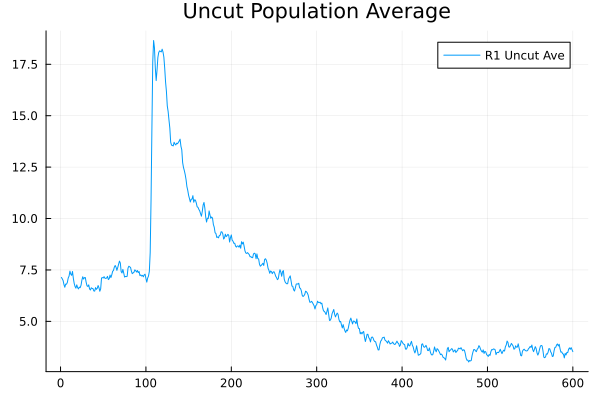

In [8]:
# Check uncut neural data and features
P1_R1_Ave = ave_vector(Probe1_R1)
plot(P1_R1_Ave, label="R1 Uncut Ave")
title!("Uncut Population Average")

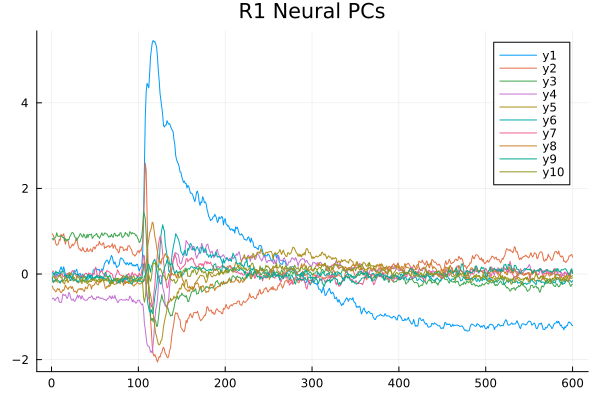

In [9]:
# Stack trials into a 3D array: 600 (time) x 12 (PCs) x N_trials
PCA_P1_R1_Ave = average_PCs(PCA_P1_R1)
plot(PCA_P1_R1_Ave)
title!("R1 Neural PCs")

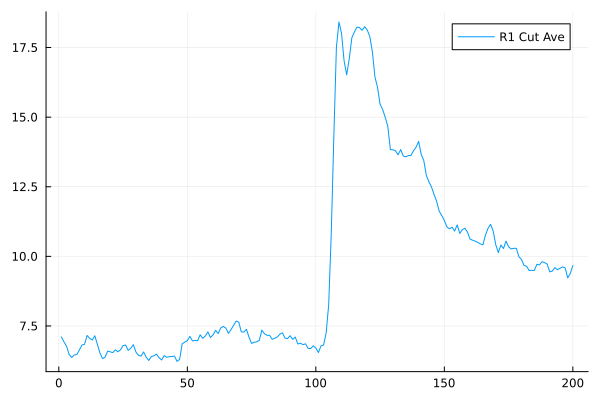

In [10]:
P1_R1_Ave_Cut = [x[1:200,:] for x in Probe1_R1_Cut if size(x,1) >=200]
P1_R1_Ave_Cut = ave_vector(P1_R1_Ave_Cut)
plot(P1_R1_Ave_Cut, label="R1 Cut Ave")

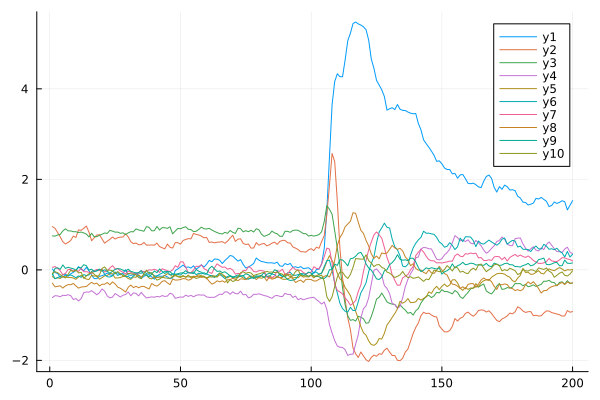

In [11]:
# Check cut neural PCs
PCA_P1_R1_Ave_Cut = [x[1:200,:] for x in PCA_P1_R1_Cut if size(x,1) >=200]
PCA11_Ave = average_PCs(PCA_P1_R1_Ave_Cut)
plot(PCA11_Ave)

In [89]:
size(PCA_P1_R1_Cut)[1]

113

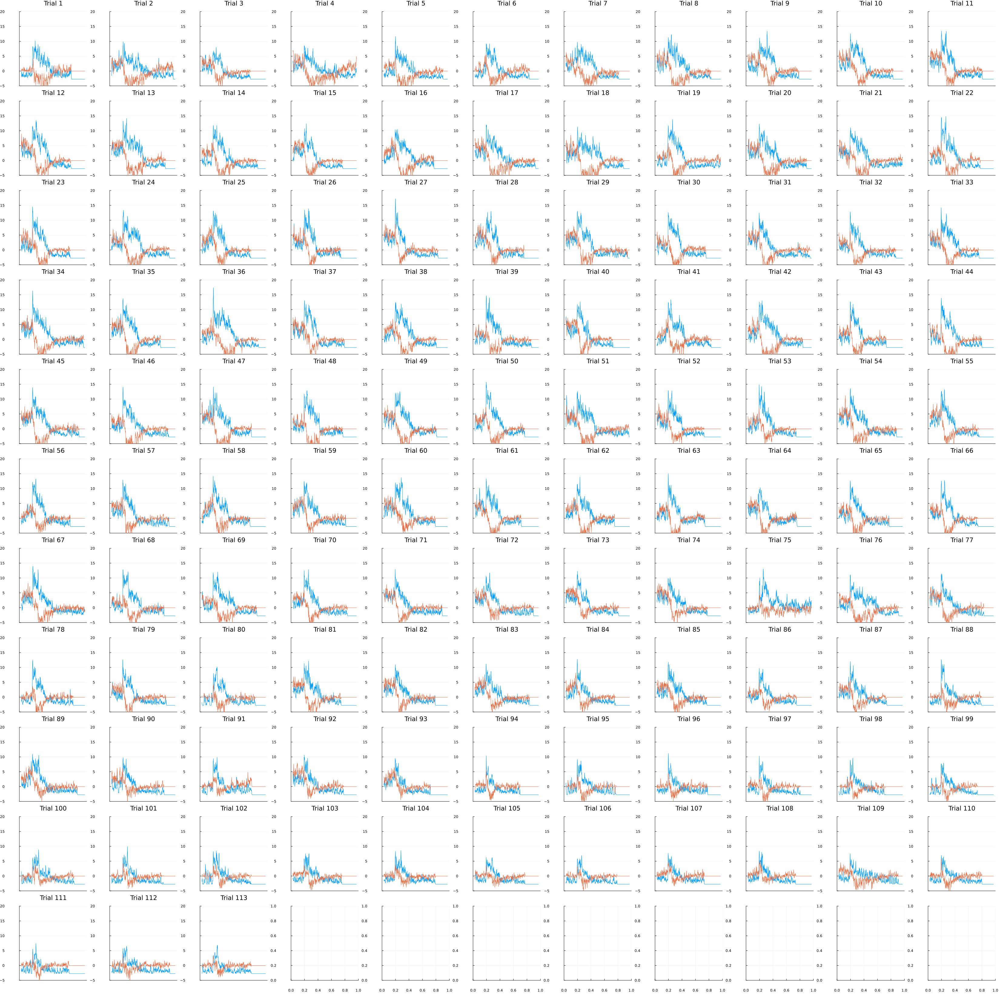

In [ ]:
n_trials = length(PCA_P1_R1_Cut)
n_cols = ceil(Int, sqrt(n_trials))
n_rows = ceil(Int, n_trials / n_cols)

plt = plot(layout = (n_rows, n_cols), size = (n_cols * 300, n_rows * 300))

for trial in 1:n_trials
    plot!(plt[trial],
          PCA_P1_R1[trial][:,1],
          label = "",
          ylim = (-5, 20),
          xticks = false,
          title = "Trial $trial")
    plot!(plt[trial], PCA_P1_R1[trial][:,2], label = "")
end
display(plt)

# # Make sure path exists
# save_dir = joinpath("Results_Window\\" * session_save)
# if !isdir(save_dir)
#     mkpath(save_dir)
# end

# savepath = joinpath(save_dir, "PC_Trajectories.png")
# savefig(plt, savepath)

# println("Plot saved to: ", savepath)


In [5]:

# Assuming KP_R1 is a vector of matrices
for i in 1:length(KP_R1)
    # Replace NaN values in each matrix with 0
    KP_R1[i] .= replace(KP_R1[i], NaN => 0.0)
end

for i in 1:length(KP_R4)
    # Replace NaN values in each matrix with 0
    KP_R4[i] .= replace(KP_R4[i], NaN => 0.0)
end

# Assuming KP_R1 is a vector of matrices
for i in 1:length(KP_R1_Cut)
    # Replace NaN values in each matrix with 0
    KP_R1_Cut[i] .= replace(KP_R1_Cut[i], NaN => 0.0)
end

for i in 1:length(KP_R4_Cut)
    # Replace NaN values in each matrix with 0
    KP_R4_Cut[i] .= replace(KP_R4_Cut[i], NaN => 0.0)
end


In [ ]:


    """
    Prefit the encoder models
    """

    println("Prefitting Encoders")
    lags=4
    leads = 0
    start_time = 90
    dif = 100-lags;


    X_R1 = [X[start_time-lags+1:end,:] for X in KP_R1]
    Y_R1 = [Y[start_time-lags+1:end, 1:10] for Y in PCA_P1_R1]
    X_R1_kernel = kernelize_window_features(X_R1)
    Y_R1_trimmed = kernelize_window_features(Y_R1)

    FCs = FCs_R1 .- start_time
    LRCs = LRCs_R1 .- start_time




    X_eng = [X_R1_kernel[i][(FCs_R1[i]-3):(FCs_R1[i]), :] for i in eachindex(X_R1_kernel)]
    Y_eng = [Y_R1_trimmed[i][(FCs_R1[i]-3):(FCs_R1[i]), :] for i in eachindex(Y_R1_trimmed)]

    # Prefit engaged model
    X_eng = vcat(X_eng...)
    Y_eng = vcat(Y_eng...)

    β_eng, Σ_eng = weighted_ridge_regression(X_eng, Y_eng, 0.01)



    """
    Set up the switching encoder model
    """
    println("Setting up switching model")

    X = [XX[start_time-lags:end,:] for XX in KP_R1_Cut]

    Y = PCA_P1_R1_Cut
    Y = [y[start_time-lags:end, 1:10] for y in Y]


    X_kern = kernelize_window_features(X)
    Y_trim = kernelize_window_features(Y)


    X_ready = permutedims.(X_kern)
    Y_ready = permutedims.(Y_trim)


    # Initialize the Gaussian HMM-GLM
    model = SwitchingGaussianRegression(;K=2, input_dim=size(X_ready[1])[1], output_dim=size(Y_ready[1])[1], include_intercept=true)

    model.B[1].β = β_eng
    model.B[1].Σ = Σ_eng

    model.A = [0.9999 0.0001; 0.0001 0.9999]
    model.πₖ = [0.0001; 0.9999]

    lls = fit_custom!(model, Y_ready, X_ready, max_iters=100)

    plot(lls)
    title!("Training Log-Likelihood")
    xlabel!("EM Iteration")
    ylabel!("Log-Likelihood")



    """
    Plot the trial averaged inference
    """
    println("Calculating average inference")
    X_R1 = [X[start_time-lags:300,:] for X in KP_R1]

    Y_R1 = [Y[start_time-lags:300,1:10] for Y in PCA_P1_R1]

    X_R1_kernel = kernelize_window_features(X_R1)

    Y_R1_trimmed = kernelize_window_features(Y_R1)

    YY = permutedims.(Y_R1_trimmed)
    XX = permutedims.(X_R1_kernel)

    FB_R1 = label_data(model, YY, XX);

    V1 = SSD.viterbi(model, YY, XX);

    # Extract γ[1, :] for each K in OO
    γ_vectors_R1 = [FB_R1[K].γ[1, :] for K in eachindex(FB_R1)]
    γ_mean_R1 = mean(exp.(hcat(γ_vectors_R1...)), dims=2)

    plot(γ_mean_R1; label="R1")
    title!("State Inference")
    ylabel!("State Probability")
    xlabel!("Time")

    Tongue_R1 = Tongue_mat_R1[start_time:300, :];

    R1_Tongue = permutedims(hcat(Tongue_R1...))
    R1_States = permutedims(hcat(γ_vectors_R1...))

    R1_Vit = permutedims(hcat(V1...))

    # Convert matrices to DataFrames, using :auto for column names (if you don't want specific column names)
    Tongue_R1 = Tongue_R1[1:201, :];

    R1_Tongue_df = DataFrame(permutedims(Tongue_R1), :auto)

    
    # Assess average PC prediction accuracy
    # Assume:
    # - X_R4_kernel: Vector of feature matrices (one per trial)
    # - Y_R4_trimmed: Vector of output matrices (one per trial)
    # - R4_States: Vector of state matrices (one per trial)
    # - model.B: Emission models (one per state)

    num_trials = length(X_R1_kernel)
    _, O = size(Y_R1_trimmed[1])  # O = number of PCs (output dims)

    # Initialize matrix to store R² scores (trials × PCs)
    r2_scores = zeros(num_trials, O)

    for trial in 1:num_trials
        X_trial = X_R1_kernel[trial]
        Y_trial = Y_R1_trimmed[trial]
        T, D = size(X_trial)

        # Initialize prediction matrix
        y_pred = zeros(T, O)

        # Add bias term (intercept)
        X_bias = hcat(ones(T), X_trial)

        for i in 1:T
            # Find the state (use exp because you stored log probs?)
            state = exp(R1_States[trial, i])

            if state == 1.0
                y_pred[i, :] = reshape(X_bias[i, :], 1, :) * model.B[1].β
            else
                y_pred[i, :] = reshape(X_bias[i, :], 1, :) * model.B[2].β
            end
        end

        # Now compute R² for each PC
        for pc in 1:O
            r2_scores[trial, pc] = r2_score(Y_trial[:, pc], y_pred[:, pc])
        end
    end

    mean_r2_per_pc = mean(r2_scores, dims=1)  # 1 × 12 matrix
    mean_r2_per_pc = vec(mean_r2_per_pc)      # convert to 12-element Vector

    
    """
    VITERBI STATES SAVED
    """

    if !isdir(joinpath("Results_Window\\" *session_save))
        mkpath(joinpath("Results_Window\\" *session_save))
    end

    println("SAVE PATH", (joinpath("Results_Window\\" *session_save, "R14_PC_R2_Reg.csv")))

    R1_States_Vit_df = DataFrame(R1_Vit, :auto)
    R1_States_df = DataFrame(R1_States, :auto)

    println("HEREHRHEHR")

    # Wrap vector into a DataFrame
    # Convert to DataFrame
    mean_r2_df = DataFrame(mean_r2_per_pc', :auto)  # make it a 1×12 DataFrame

    println("HERE")
    println(session_save)
    # Save
    CSV.write(joinpath("Results_Window\\" *session_save, "R1_PC_R2_Reg.csv"), mean_r2_df; header=false)
    println("EHRHEHEHE")
    CSV.write(joinpath("Results_Window\\" *session_save, "R1_Tongue_Reg.csv"), R1_Tongue_df; header=false)
    CSV.write(joinpath("Results_Window\\" *session_save, "R1_States_Reg.csv"), R1_States_df; header=false)
    CSV.write(joinpath("Results_Window\\" *session_save, "R1_States_Vit_Reg.csv"), R1_States_Vit_df; header=false)

    println("SESSION DATA SAVED")


catch err
    # Prepare error message as a string
    error_msg = IOBuffer()
    println(error_msg, "Error: ", err)
    println(error_msg, "Stacktrace:")
    for frame in stacktrace(catch_backtrace())
        println(error_msg, frame)
    end

    # # Save to file
    # error_file = joinpath("Results_Window", session_save, "KP2PC", "error_log.txt")
    # open(error_file, "w") do f
    #     write(f, String(take!(error_msg)))
    # end
end



